# **CRATER DETECTION WITH OPENCV USING HOUGH CIRCLE TRANSFORM**
## Image Processing Project
### *Aydoğan Arslantaş - 00210304036*

### 1.A: Importing Libraries

In [469]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

### 1.B: Setting the Path
Usable Images:


*   /content/hole1.jpg
*   /content/moon-close.webp
*   /content/moon1.webp
*   /content/moon2.jpg
*   /content/mars3.png





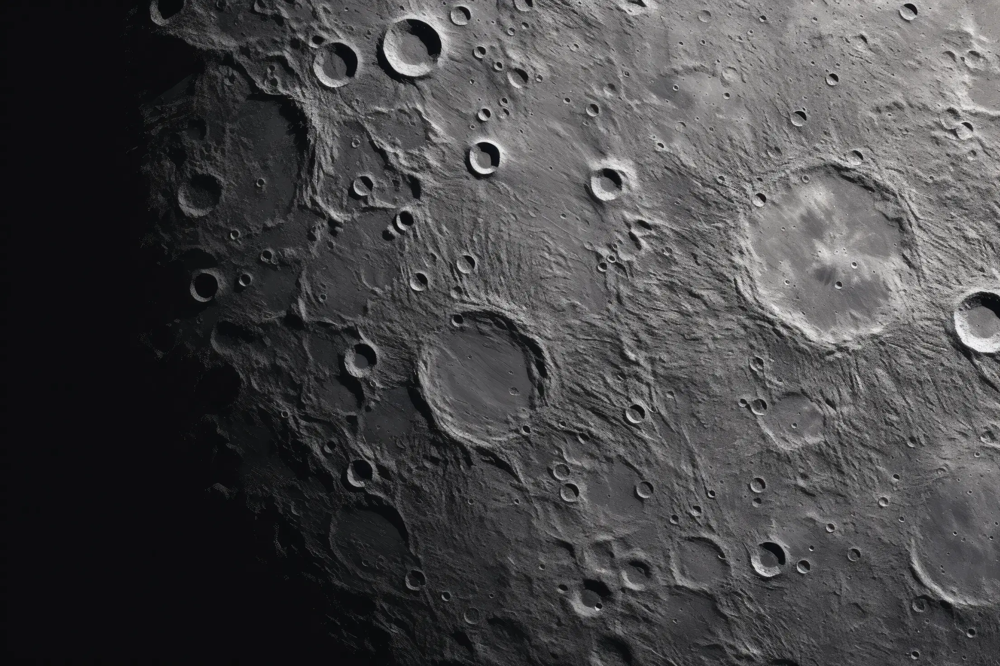

In [470]:
image_path = '/content/moon-close.webp'
image = cv2.imread(image_path)
cv2_imshow(image)

## 2. The Algorithm

### 2.A: The Function to Detect Craters

In [471]:
def detect_moon_craters(img):

    circle_params = [
        (15, 5, 15),    # Very small craters: min distance, min radius, max radius
        (30, 15, 30),   # Small craters: min distance, min radius, max radius
        (60, 30, 60),   # Medium craters: min distance, min radius, max radius
        (100, 60, 120), # Large craters: min distance, min radius, max radius
        (200, 120, 200) # Gigantic craters: min distance, min radius, max radius
    ]

    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(img_gray, (21, 21), cv2.BORDER_DEFAULT)

    # List to store detected circles
    detected_circles = []

    # Iterate through predefined parameters and apply Hough Circle Transform
    for distance, min_radius, max_radius in circle_params:
        circles = cv2.HoughCircles(
            blurred,
            cv2.HOUGH_GRADIENT,
            dp=0.8,  # Higher resolution parameter
            minDist=distance,
            param1=50,  # Canny edge detection threshold
            param2=20,  # Accumulator threshold for confirming circles
            minRadius=min_radius,
            maxRadius=max_radius
        )
        if circles is not None:
            detected_circles.append(circles[0])  # Extract circles detected in this iteration

    # Combine all detected circles into a single array
    if detected_circles:
        all_circs = np.vstack(detected_circles)  # Stack detected circles
        all_circs_rounded = np.uint16(np.around(all_circs))
        filtered_circles = merge_circles_based_on_center(all_circs_rounded)
    else:
        filtered_circles = np.empty((0, 3), dtype=np.uint16)  # Empty array if no circles found

    return filtered_circles

### 2.B: Merging Overlapping Circles
This function merges circles if the center of one circle is inside the area of another circle.


In [472]:
def merge_circles_based_on_center(circles):

    circles = np.array(circles, dtype=np.float32)
    merged_circles = []

    for i, (x1, y1, r1) in enumerate(circles):
        merged = False

        for j, (x2, y2, r2) in enumerate(merged_circles):
            # Calculate the distance between the centers of the two circles
            distance = np.sqrt((x1 - x2) ** 2 + (y1 - y2) ** 2)

            # Check if the center of circle 1 is inside circle 2 (distance < r2) or vice versa
            if distance < r2:  # Circle 1's center is inside Circle 2
                new_x = (x1 + x2) / 2
                new_y = (y1 + y2) / 2
                new_r = max(r1, r2)  # Keep the larger radius
                merged_circles[j] = (new_x, new_y, new_r)
                merged = True
                break
            elif distance < r1:  # Circle 2's center is inside Circle 1
                new_x = (x1 + x2) / 2
                new_y = (y1 + y2) / 2
                new_r = max(r1, r2)  # Keep the larger radius
                merged_circles[j] = (new_x, new_y, new_r)
                merged = True
                break

        if not merged:
            merged_circles.append((x1, y1, r1))

    return np.array(merged_circles, dtype=np.uint16)

### 2.C: Filling the Craters

In [473]:
# Function to fill craters
def fill_craters(image, circles):
    for (x, y, r) in circles:
        cv2.circle(image, (x, y), r, (255, 255, 255), thickness=-1)  # Fill with white
    return image


### 2.D: Displaying Results

Number of detected craters: 47


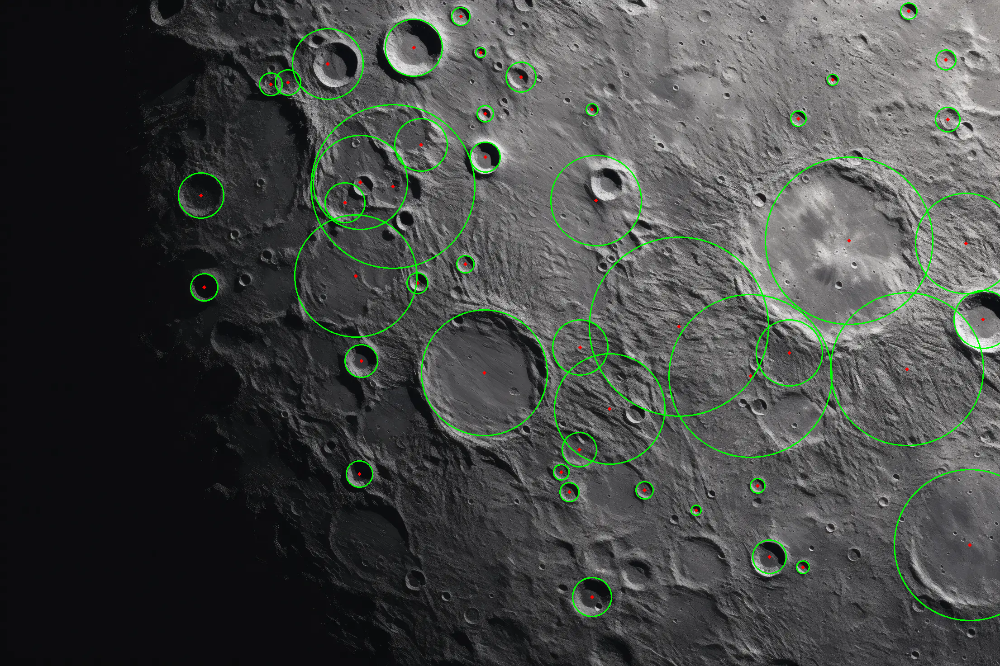

In [474]:
# Detect craters
detected_circles = detect_moon_craters(image)

# Draw the detected craters on the image
if detected_circles.size > 0:
    for x, y, r in detected_circles:
        # Draw the outer circle
        cv2.circle(image, (x, y), r, (0, 255, 0), 2)
        # Draw the center of the circle
        cv2.circle(image, (x, y), 2, (0, 0, 255), 3)

# Count the number of detected craters
num_craters = len(detected_circles)

# Print the number of craters detected
print(f'Number of detected craters: {num_craters}')
cv2_imshow(image)

## 3. Results of All Images

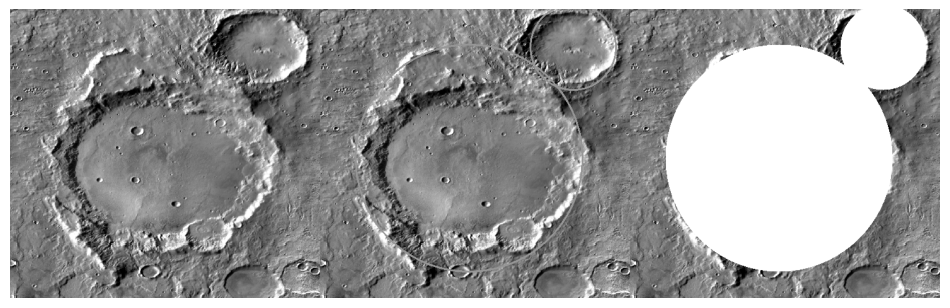

Number of detected craters: 2


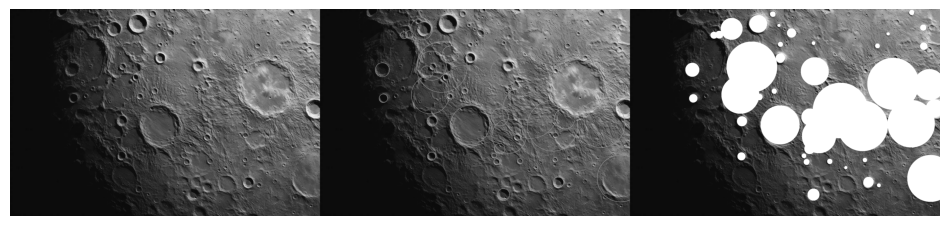

Number of detected craters: 47


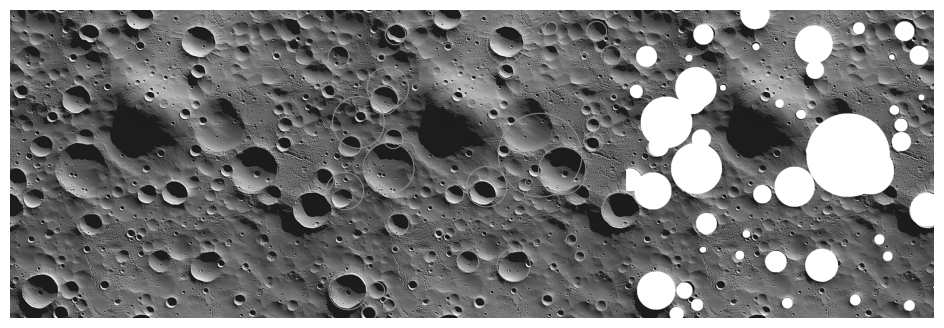

Number of detected craters: 49


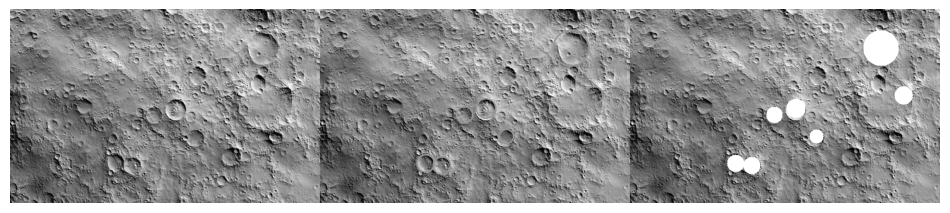

Number of detected craters: 7


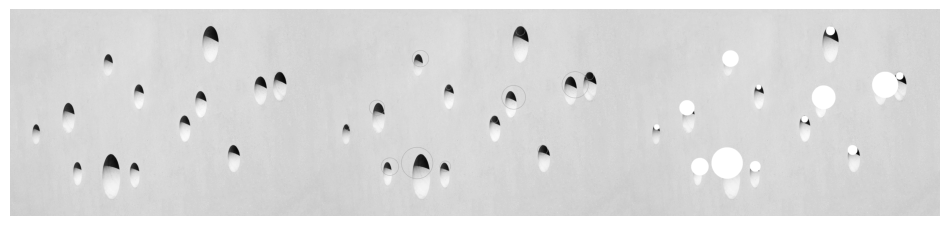

Number of detected craters: 13


In [475]:
# Function to process and display original, detected, and filled images side by side
def process_and_display(image_paths):
    for path in image_paths:
        # Load the image
        img = cv2.imread(path)

        if img is None:
            print(f"Error loading image {path}")
            continue

        # Detect craters (circles)
        detected_circles = detect_moon_craters(img)

        # Create a copy of the original image to draw circles on it
        img_detected = img.copy()
        for (x, y, r) in detected_circles:
            cv2.circle(img_detected, (x, y), r, (0, 255, 0), 2)  # Draw detected circles in green

        # Fill craters with white
        img_filled = fill_craters(img.copy(), detected_circles)

        # Convert all images to grayscale (optional)
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img_detected_gray = cv2.cvtColor(img_detected, cv2.COLOR_BGR2GRAY)
        img_filled_gray = cv2.cvtColor(img_filled, cv2.COLOR_BGR2GRAY)

        # Concatenate the three images horizontally
        combined_img = np.hstack((img_gray, img_detected_gray, img_filled_gray))

        # Display the images using Matplotlib (side by side)
        plt.figure(figsize=(12, 4))
        plt.imshow(combined_img, cmap='gray')
        plt.axis('off')
        plt.show()

        # Print the number of detected craters
        print(f"Number of detected craters: {len(detected_circles)}")


# List of image paths
image_paths = ["/content/mars3.png", "/content/moon-close.webp", "/content/moon1.webp", "/content/moon2.jpg","/content/hole1.jpg"]

# Process each image
process_and_display(image_paths)